# Transfer Learning Model
* Pretrained model = Foundadtional Model

In [1]:
import torch
import torchvision
from torchvision import datasets, transforms

from torch.utils.data import DataLoader

import matplotlib.pyplot as plt
import numpy as np


In [2]:
print(torch.__version__)
print(torchvision.__version__)

2.5.1+cu124
0.20.1+cu124


In [3]:
# Setup device agnostic code
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

In [4]:
import os
import zipfile

from pathlib import Path

import requests

# Setup path to data folder
data_path = Path("data/")
image_path = data_path / "pizza_steak_sushi"

# If the image folder doesn't exist, download it and prepare it...
if image_path.is_dir():
    print(f"{image_path} directory exists.")
else:
    print(f"Did not find {image_path} directory, creating one...")
    image_path.mkdir(parents=True, exist_ok=True)

    # Download pizza, steak, sushi data
    with open(data_path / "pizza_steak_sushi.zip", "wb") as f:
        request = requests.get("https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip")
        print("Downloading pizza, steak, sushi data...")
        f.write(request.content)

    # Unzip pizza, steak, sushi data
    with zipfile.ZipFile(data_path / "pizza_steak_sushi.zip", "r") as zip_ref:
        print("Unzipping pizza, steak, sushi data...")
        zip_ref.extractall(image_path)

    # Remove .zip file
    os.remove(data_path / "pizza_steak_sushi.zip")

Did not find data/pizza_steak_sushi directory, creating one...
Unzipping pizza, steak, sushi data...


In [5]:
# Setup Dirs
train_dir = image_path / "train"
test_dir = image_path / "test"

## Turning data into Pytorch DataLaoder
* when using a pretrained model, it's important that **your custom data going into the model is prepared in the same way as the original training data that went into the model**.

### Manual

In [6]:
from torchvision import transforms

normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])

# Create a transforms pipeline manually (required for torchvision < 0.13)
manual_transforms = transforms.Compose([
    transforms.Resize((224, 224)), # 1. Reshape all images to 224x224 (though some models may require different sizes)
    transforms.ToTensor(), # 2. Turn image values to between 0 & 1
    transforms.Normalize(mean=[0.485, 0.456, 0.406], # 3. A mean of [0.485, 0.456, 0.406] (across each colour channel)
                         std=[0.229, 0.224, 0.225]) # 4. A standard deviation of [0.229, 0.224, 0.225] (across each colour channel),
])

In [7]:
train_data = datasets.ImageFolder(root=train_dir, # target folder of images
                                  transform=manual_transforms, # transforms to perform on data (images)
                                  target_transform=None) # transforms to perform on labels (if necessary)


test_data = datasets.ImageFolder(root=test_dir, # target folder of images
                                  transform=manual_transforms, # transforms to perform on data (images)
                                  target_transform=None) # transforms to perform on labels (if necessary)


In [8]:
train_loader = DataLoader(dataset=train_data,
                                     batch_size=1, # how many samples per batch?
                                     num_workers=1, # how many subprocesses to
                                     shuffle = True) # shuffle the data?

test_loader =DataLoader(dataset=test_data,
                                     batch_size=1, # how many samples per batch?
                                     num_workers=1, # how many subprocesses to
                                     shuffle = False) #

### Automatic Transforms

* Here what we had done is
  1.  Preloading weights
  2. Preloading transforms

* make train/ test Data usning ImageLoader
* make dataLoader for the  model

In [9]:
# Get a set of pretrained model weights
weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT # .DEFAULT = best available weights from pretraining on ImageNet
weights

EfficientNet_B0_Weights.IMAGENET1K_V1

In [10]:
# Get the transforms used to create our pretrained weights
auto_transforms = weights.transforms()
auto_transforms

ImageClassification(
    crop_size=[224]
    resize_size=[256]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BICUBIC
)

In [11]:
## Creating  train data and Dataloaders
# Setup Dirs
train_dir = image_path / "train"
test_dir = image_path / "test"


train_data = datasets.ImageFolder(root=train_dir, # target folder of images
                                  transform=auto_transforms, # transforms to perform on data (images)
                                  target_transform=None) # transforms to perform on labels (if necessary)


test_data = datasets.ImageFolder(root=test_dir, # target folder of images
                                  transform=auto_transforms, # transforms to perform on data (images)
                                  target_transform=None) # transforms to perform on labels (if necessary)


train_loader =DataLoader(dataset=train_data,
                                     batch_size=1, # how many samples per batch?
                                     num_workers=1, # how many subprocesses to
                                     shuffle = True) # shuffle the data?

test_loader =DataLoader(dataset=test_data,
                                     batch_size=1, # how many samples per batch?
                                     num_workers=1, # how many subprocesses to
                                     shuffle = False) #

In [12]:
class_names = train_data.classes
class_names

['pizza', 'steak', 'sushi']

## Getting Pretrained model
 1. Pytorch Libraries
 2. Libraries Like `timm` (torch image modules)
 3. HuggingFace Hub(For plenty of different models)
 4. Papers withcode(for models across different problem space/domains)


# Setting up a pretrained model

In [13]:
weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT # .DEFAULT = best available weights from pretraining on ImageNet
weights

EfficientNet_B0_Weights.IMAGENET1K_V1

In [14]:
# Get the transforms used to create our pretrained weights
auto_transforms = weights.transforms()
auto_transforms

ImageClassification(
    crop_size=[224]
    resize_size=[256]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BICUBIC
)

In [15]:
## Creating  train data and Dataloaders
# Setup Dirs
train_dir = image_path / "train"
test_dir = image_path / "test"


train_data = datasets.ImageFolder(root=train_dir, # target folder of images
                                  transform=auto_transforms, # transforms to perform on data (images)
                                  target_transform=None) # transforms to perform on labels (if necessary)


test_data = datasets.ImageFolder(root=test_dir, # target folder of images
                                  transform=auto_transforms, # transforms to perform on data (images)
                                  target_transform=None) # transforms to perform on labels (if necessary)


train_loader = DataLoader(dataset=train_data,
                                     batch_size=32, # how many samples per batch?
                                     num_workers=1, # how many subprocesses to
                                     shuffle = True) # shuffle the data?

test_loader = DataLoader(dataset=test_data,
                                     batch_size=32, # how many samples per batch?
                                     num_workers=1, # how many subprocesses to
                                     shuffle = False) #

In [16]:
model = torchvision.models.efficientnet_b0(weights=weights).to(device)
model

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 146MB/s]


EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActivat

In [17]:
model.classifier

Sequential(
  (0): Dropout(p=0.2, inplace=True)
  (1): Linear(in_features=1280, out_features=1000, bias=True)
)

In [18]:
pip install torchinfo

In [19]:
# Print a summary using torchinfo (uncomment for actual output)
from torchinfo import summary

summary(model=model,
        input_size=(32, 3, 224, 224), # make sure this is "input_size", not "input_shape"
        # col_names=["input_size"], # uncomment for smaller output
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]    [32, 1000]           --                   True
├─Sequential (features)                                      [32, 3, 224, 224]    [32, 1280, 7, 7]     --                   True
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 32, 112, 112]   --                   True
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]    [32, 32, 112, 112]   864                  True
│    │    └─BatchNorm2d (1)                                  [32, 32, 112, 112]   [32, 32, 112, 112]   64                   True
│    │    └─SiLU (2)                                         [32, 32, 112, 112]   [32, 32, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 32, 112, 112]   [32, 16, 112

## Frrezing the Base modelm and changing the output layer to suit your own problem

In [20]:
for param in model.features.parameters():
  param.requires_grad = False

In [21]:
summary(model=model,
        input_size=(32, 3, 224, 224), # make sure this is "input_size", not "input_shape"
        # col_names=["input_size"], # uncomment for smaller output
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]    [32, 1000]           --                   Partial
├─Sequential (features)                                      [32, 3, 224, 224]    [32, 1280, 7, 7]     --                   False
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 32, 112, 112]   --                   False
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]    [32, 32, 112, 112]   (864)                False
│    │    └─BatchNorm2d (1)                                  [32, 32, 112, 112]   [32, 32, 112, 112]   (64)                 False
│    │    └─SiLU (2)                                         [32, 32, 112, 112]   [32, 32, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 32, 112, 112]   [32, 

In [22]:
from torch import nn
# Load the pretrained model
model = torchvision.models.efficientnet_b0(weights=weights).to(device)
torch.manual_seed(42)
torch.cuda.manual_seed(42)

model.classifier = nn.Sequential(
    nn.Dropout(p = 0.2, inplace = True),
    nn.Linear(in_features = 1280, out_features = len(class_names))
).to(device)

model.classifier

Sequential(
  (0): Dropout(p=0.2, inplace=True)
  (1): Linear(in_features=1280, out_features=3, bias=True)
)

In [23]:
summary(model=model,
        input_size=(32, 3, 224, 224), # make sure this is "input_size", not "input_shape"
        # col_names=["input_size"], # uncomment for smaller output
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]    [32, 3]              --                   True
├─Sequential (features)                                      [32, 3, 224, 224]    [32, 1280, 7, 7]     --                   True
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 32, 112, 112]   --                   True
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]    [32, 32, 112, 112]   864                  True
│    │    └─BatchNorm2d (1)                                  [32, 32, 112, 112]   [32, 32, 112, 112]   64                   True
│    │    └─SiLU (2)                                         [32, 32, 112, 112]   [32, 32, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 32, 112, 112]   [32, 16, 112

## Train The Model

In [24]:
optimizer = torch.optim.SGD(params = model.parameters(),lr = 0.1)
Loss_fn = nn.CrossEntropyLoss()

In [25]:
from sklearn.metrics import accuracy_score
epochs = 10

epoch_count = []
train_loss_values = []
train_acc_values = []
test_loss_values = []
test_acc_values = []

for epoch in range(epochs):
  model.train()
  train_loss = 0.0
  train_acc = 0.0

  for batch, (X_train, y_train) in enumerate(train_loader):
    X_train, y_train = X_train.to(device), y_train.to(device)
    # Forward PAss
    y_logits = model(X_train)
    y_pred = torch.argmax(torch.softmax(y_logits, dim = 1), dim = 1)

    loss = Loss_fn(y_logits, y_train)
    acc = accuracy_score(y_train.cpu().numpy(),
                         y_pred.cpu().numpy())
    # Backward PAss
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    train_loss +=loss.item()
    train_acc += acc
  train_loss = train_loss / len(train_loader)
  train_acc = train_acc / len(train_loader)
  epoch_count.append(epoch)
  train_loss_values.append(train_loss)
  train_acc_values.append(train_acc)


  model.eval()
  test_loss = 0.0
  test_acc = 0.0
  with torch.inference_mode():
    for _, (X_test, y_test) in enumerate(test_loader):
      X_test, y_test = X_test.to(device), y_test.to(device)
      # Forward Pass
      test_logits = model(X_test)
      test_pred = torch.argmax(torch.softmax(test_logits, dim = 1), dim= 1)

      t_loss = Loss_fn(test_logits, y_test)
      t_acc = accuracy_score(y_test.cpu().numpy(),
                             test_pred.cpu().numpy())

      test_loss += t_loss.item()
      test_acc += t_acc
    test_loss = test_loss / len(test_loader)
    test_acc = test_acc / len(test_loader)
    test_loss_values.append(test_loss)
    test_acc_values.append(test_acc)

  print(f"Epoch: {epoch}\n-------")
  print(f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f}")
  print(f"Test Loss: {test_loss:.4f} | Test Acc: {test_acc:.4f}")





Epoch: 0
-------
Train Loss: 0.8659 | Train Acc: 0.5977
Test Loss: 0.8283 | Test Acc: 0.7083
Epoch: 1
-------
Train Loss: 0.5056 | Train Acc: 0.7617
Test Loss: 1.2431 | Test Acc: 0.4564
Epoch: 2
-------
Train Loss: 0.3350 | Train Acc: 0.8203
Test Loss: 0.5177 | Test Acc: 0.8333
Epoch: 3
-------
Train Loss: 0.3747 | Train Acc: 0.8359
Test Loss: 0.6195 | Test Acc: 0.6420
Epoch: 4
-------
Train Loss: 0.3298 | Train Acc: 0.8516
Test Loss: 0.4173 | Test Acc: 0.8362
Epoch: 5
-------
Train Loss: 0.2842 | Train Acc: 0.8281
Test Loss: 0.2323 | Test Acc: 0.9072
Epoch: 6
-------
Train Loss: 0.3018 | Train Acc: 0.8711
Test Loss: 0.4981 | Test Acc: 0.7746
Epoch: 7
-------
Train Loss: 0.0725 | Train Acc: 0.9766
Test Loss: 0.1967 | Test Acc: 0.9280
Epoch: 8
-------
Train Loss: 0.3929 | Train Acc: 0.8711
Test Loss: 1.0482 | Test Acc: 0.6799
Epoch: 9
-------
Train Loss: 0.0890 | Train Acc: 0.9805
Test Loss: 0.2533 | Test Acc: 0.9688


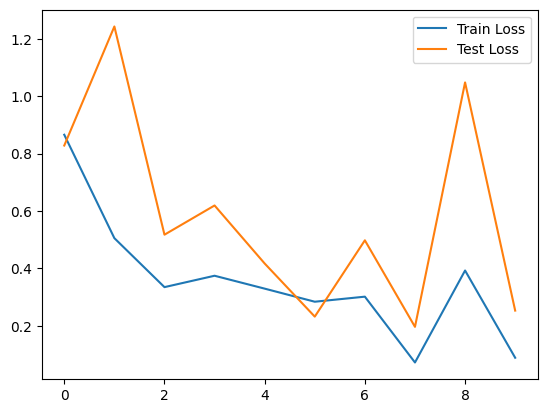

In [26]:
import matplotlib.pyplot as plt

plt.plot(epoch_count, train_loss_values, label = "Train Loss")
plt.plot(epoch_count, test_loss_values, label = "Test Loss")
plt.legend()
plt.show()

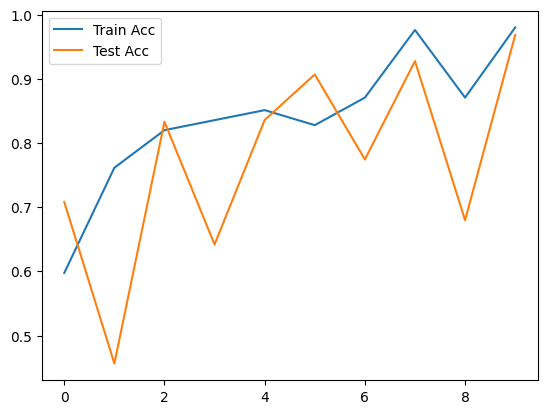

In [27]:
plt.plot(epoch_count, train_acc_values, label = "Train Acc")
plt.plot(epoch_count, test_acc_values, label = "Test Acc")
plt.legend()
plt.show()

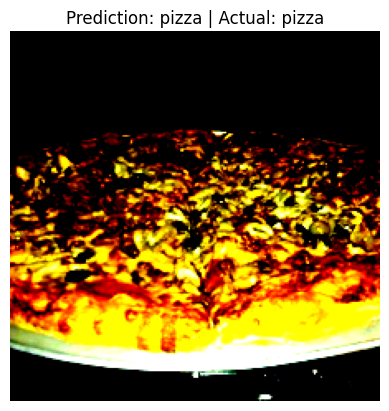

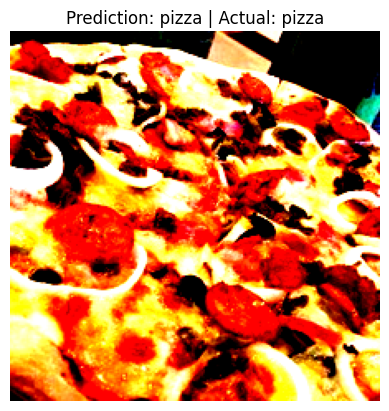

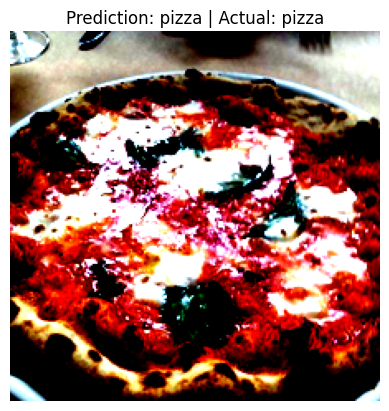

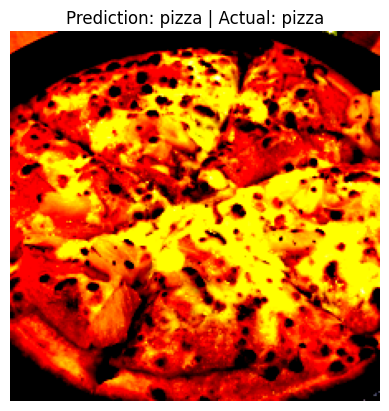

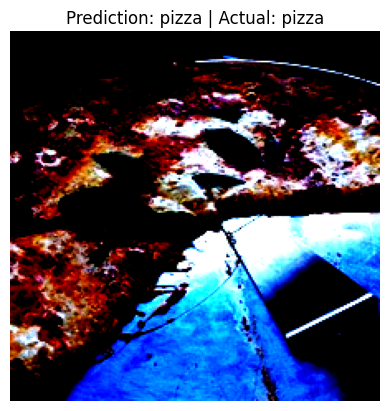

...

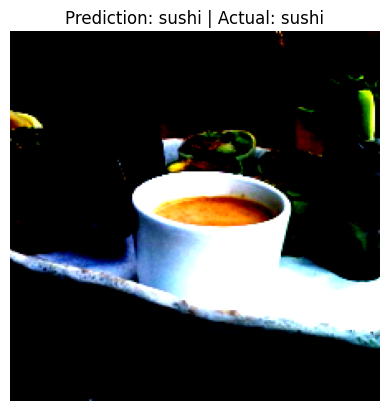

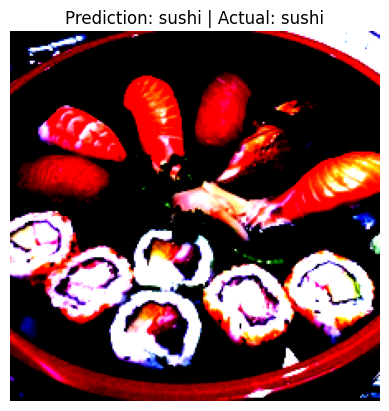

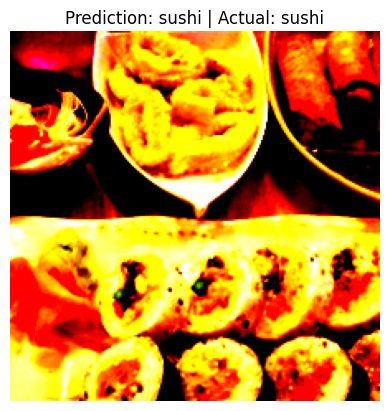

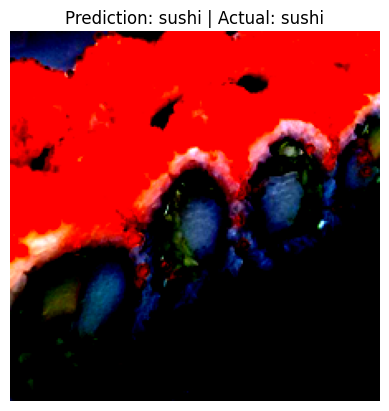

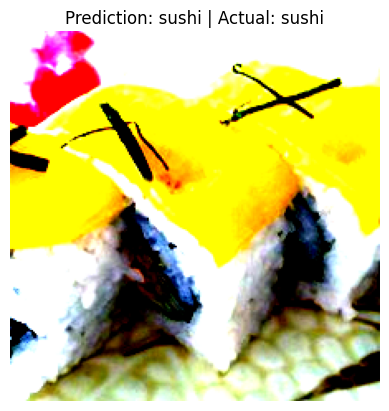

In [36]:
import matplotlib.pyplot as plt

model.eval()
with torch.inference_mode():
  for i in range(len(test_data)):
    image, label = test_data[i]
    logits = model(image.unsqueeze(0).to(device))
    prediction = torch.argmax(torch.softmax(logits, dim=1), dim = 1)
    plt.imshow(image.permute(1,2,0))
    plt.title(f"Prediction: {class_names[prediction]} | Actual: {class_names[label]}")
    plt.axis(False)
    plt.show()
    plt.close()
